### Technical Indicators

Technical indicators are mathematical calculation based on historical price, volume or open interest information to predict asset price director.
- Fundamental part of technical analysis which is based on analyzing trends, chart, patterns etc.
- Most TIs are lagging indicators- used to confirm trends (typically in conjuction with other TIs)
-  Different from fundamental analysis in that this approach is indifferent about stock's financials or operational details since Efficient Market Hypothesis contends that all information is already price in by the market.
- Popular technical indicators includes:
  1. MACD: Moving Average Convergence Divergence
  2. Bollinger Bands
  3. RSI: Relative Strength Index
  4. ADX: Average Directional Index
  5. Supertrend
  6. Renko Charts

#### Introduction of Charts

We will use trading view charting platform. Because Yahoo doesn't provide mathematical formual for technical indicators. 

#### MACD- Moving Average Convergence Divergence

- It is a trend following momentum indicator which is calculated by taking the difference of two moving average of an asset price (typically 12 period MA and 26 period MA).
- A signal line is also calculated which is again a moving average (typically 9 period) of the MACD line calculated as per the above step.
- The MACD line cutting the signal line from below signals bullish period and former cuttig the latter from above signal bearish period. This is called crossover strategy.
- Many false positive- especially during sideways market.
- Suggested that this indicator be used in conjunction with other indicators.
- Lagging indicator- Trails behind the actual price active.

In [1]:
# Import necesary libraries
import yfinance as yf

# Download historical data for required stocks
tickers = ["MSFT","AAPL","GOOG"]
ohlcv_data = {}

# looping over tickers and storing OHLCV dataframe in dictionary
for ticker in tickers:
    temp = yf.download(ticker,period='1mo',interval='15m')
    temp.dropna(how="any",inplace=True)
    ohlcv_data[ticker] = temp

def MACD(DF, a=12 ,b=26, c=9):
    """function to calculate MACD
       typical values a(fast moving average) = 12; 
                      b(slow moving average) =26; 
                      c(signal line ma window) =9"""
    df = DF.copy()
    # exponential moving average
    df["ma_fast"] = df["Adj Close"].ewm(span=a, min_periods=a).mean()
    df["ma_slow"] = df["Adj Close"].ewm(span=b, min_periods=b).mean()
    df["macd"] = df["ma_fast"] - df["ma_slow"]
    df["signal"] = df["macd"].ewm(span=c, min_periods=c).mean()
    return df.loc[:,["macd","signal"]]

for ticker in ohlcv_data:
    ohlcv_data[ticker][["MACD","SIGNAL"]] = MACD(ohlcv_data[ticker], a=12 ,b=26, c=9)

C:\ProgramData\Anaconda3\envs\API\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\ProgramData\Anaconda3\envs\API\lib\site-packages\numpy\.libs\libopenblas.el2c6ple4zyw3eceviv3oxxgrn2nrfm2.gfortran-win_amd64.dll
C:\ProgramData\Anaconda3\envs\API\lib\site-packages\numpy\.libs\libopenblas.fb5ae2tyxyh2ijrdkgdgq3xbklktf43h.gfortran-win_amd64.dll
C:\ProgramData\Anaconda3\envs\API\lib\site-packages\numpy\.libs\libopenblas64__v0.3.23-gcc_10_3_0.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


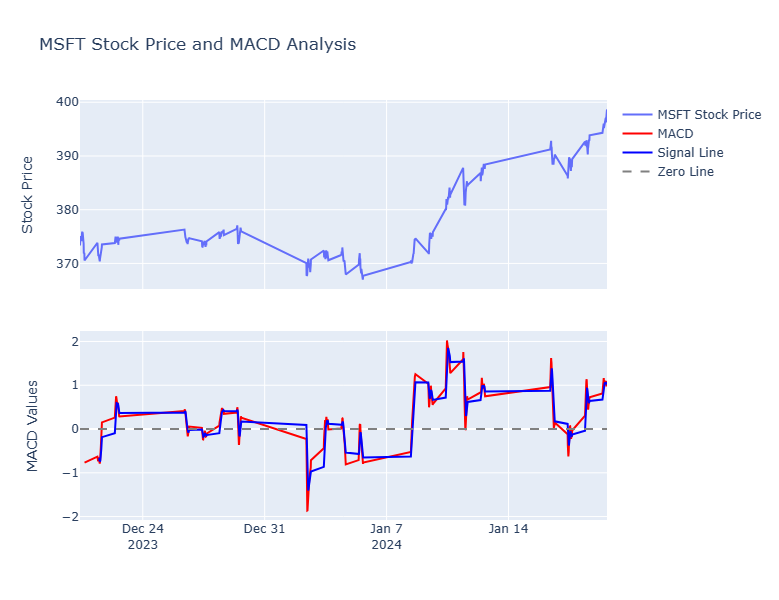

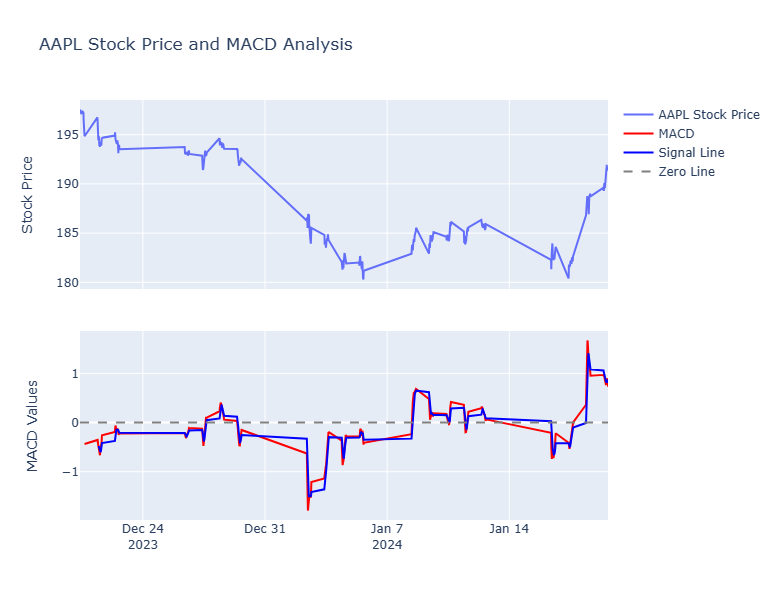

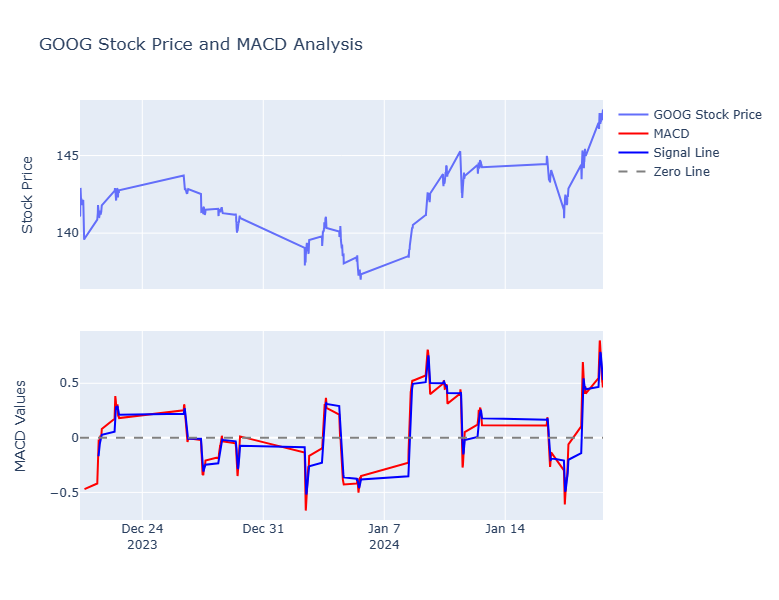

In [2]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd

# Plotting the time series with MACD and Signal Line using plotly
for ticker in ohlcv_data:
    df = ohlcv_data[ticker]
    
    # Create traces for OHLC
    trace1 = go.Scatter(x=df.index, y=df['Adj Close'], mode='lines', name=f'{ticker} Stock Price')
    
    # Create traces for MACD and Signal Line
    trace2 = go.Scatter(x=df.index, y=df['MACD'], mode='lines', name='MACD', line=dict(color='red'))
    trace3 = go.Scatter(x=df.index, y=df['SIGNAL'], mode='lines', name='Signal Line', line=dict(color='blue'))
    trace4 = go.Scatter(x=df.index, y=[0]*len(df), mode='lines', name='Zero Line', line=dict(color='gray', dash='dash'))
    
    # Create subplot
    fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.1)
    
    # Add traces to subplot
    fig.add_trace(trace1, row=1, col=1)
    fig.add_trace(trace2, row=2, col=1)
    fig.add_trace(trace3, row=2, col=1)
    fig.add_trace(trace4, row=2, col=1)
    
    # Update layout
    fig.update_layout(title=f'{ticker} Stock Price and MACD Analysis', showlegend=True, height=600)
    fig.update_yaxes(title_text='Stock Price', row=1, col=1)
    fig.update_yaxes(title_text='MACD Values', row=2, col=1)
    
    # Show the plot
    fig.show()

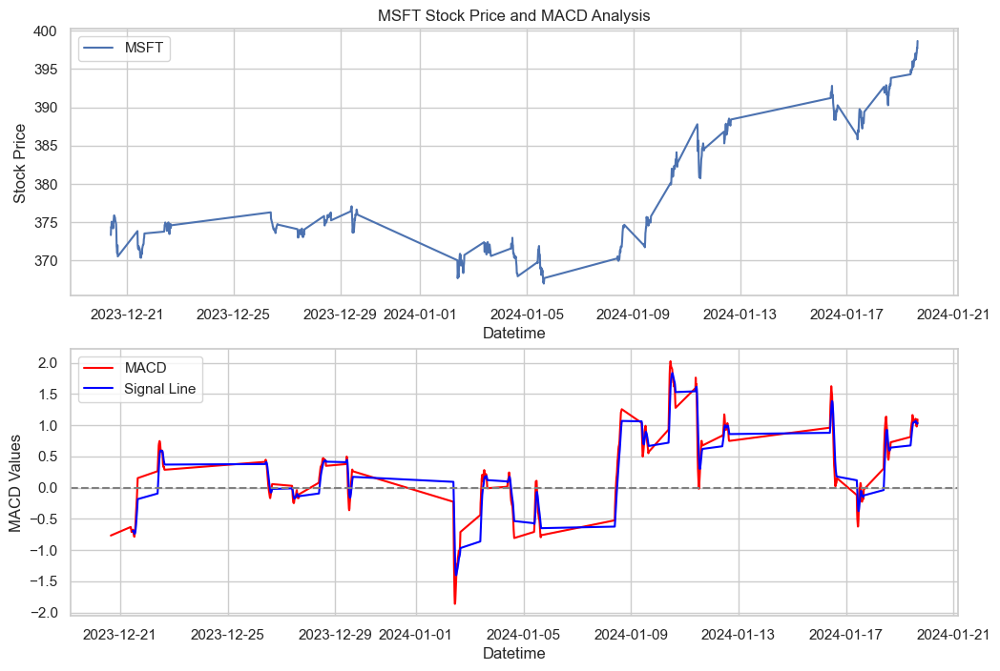

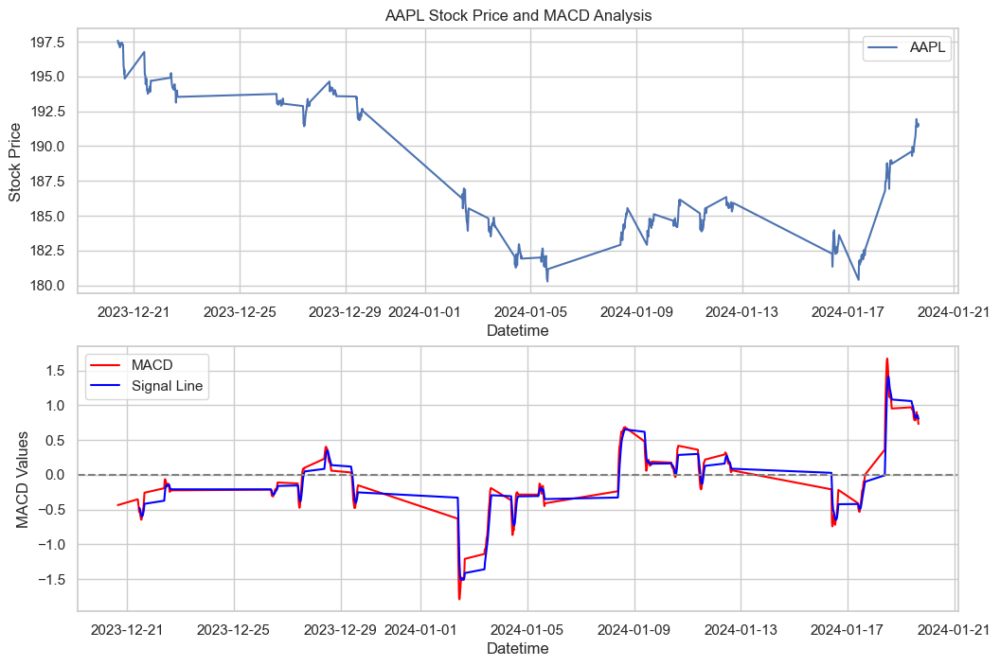

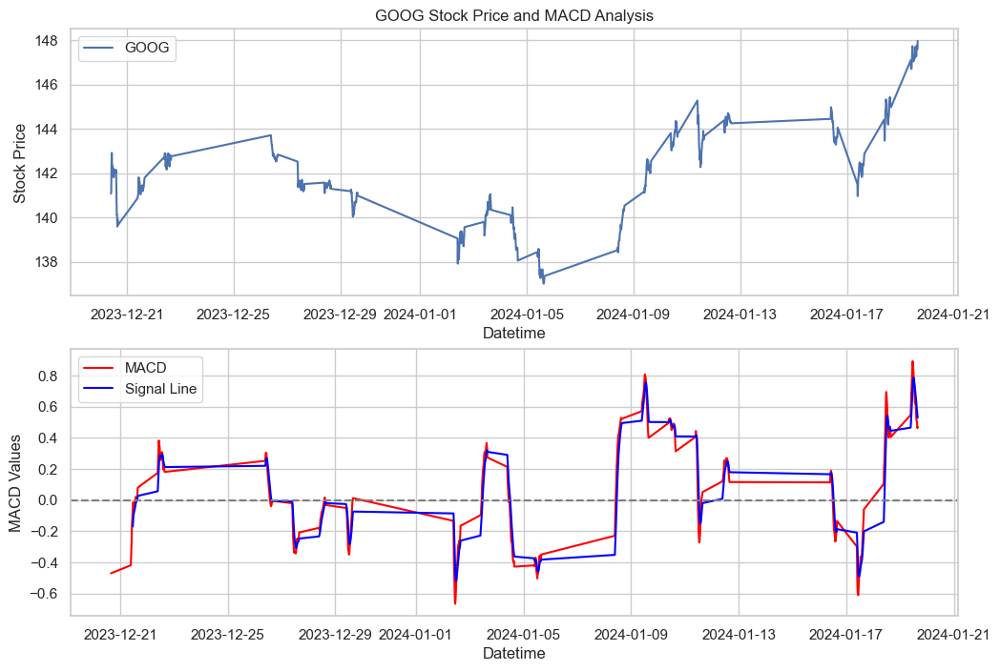

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plotting the time series with MACD and Signal Line using seaborn
for ticker in ohlcv_data:
    df = ohlcv_data[ticker]
    
    # Set the style for seaborn
    sns.set(style="whitegrid")
    
    # Plotting OHLC
    plt.figure(figsize=(12, 8))
    plt.subplot(2, 1, 1)
    sns.lineplot(x=df.index, y=df['Adj Close'], label=ticker)
    plt.title(f'{ticker} Stock Price and MACD Analysis')
    plt.ylabel('Stock Price')
    
    # Plotting MACD and Signal Line
    plt.subplot(2, 1, 2)
    sns.lineplot(x=df.index, y=df['MACD'], label='MACD', color='red')
    sns.lineplot(x=df.index, y=df['SIGNAL'], label='Signal Line', color='blue')
    plt.axhline(y=0, color='gray', linestyle='--')  # Adding zero line for reference
    plt.legend()
    plt.ylabel('MACD Values')
    plt.show()

In [4]:
ohlcv_data["MSFT"][["MACD","SIGNAL"]]

,MACD,SIGNAL
Datetime,,
2023-12-20 09:30:00,NaN,NaN
2023-12-20 09:45:00,NaN,NaN
2023-12-20 10:00:00,NaN,NaN
2023-12-20 10:15:00,NaN,NaN
2023-12-20 10:30:00,NaN,NaN
...,...,...
2024-01-19 14:45:00,0.986876,1.036692
2024-01-19 15:00:00,0.977249,1.024803
2024-01-19 15:15:00,1.009903,1.021823


#### Bollinger Bands & ATR (Average True Range)

- Both Bollinger bands and ATR are volatility based indicators.
- Bollinger band comprises of two lines plotted n (n is typically 2) standard deviations from a m period simple moving average line (m is typically 20);
The bands widen during periods of increased volatility and shrink during period of reduced volatility.
-  ATR focused on total price movement and conveys how widely the market is swinging as it moves. It takes into account the price movement in each period by considering the following ranges:
     1. Difference between High and Low of each period.
     2. Difference between High and previous period's close.
     3. Difference between Low and previous period's close.
- Traders typically use them in conjuction as they approcah volatility differently and are complimentary.

In [5]:
# Download historical data for required stocks
tickers = ["AMZN","GOOG","MSFT"]
ohlcv_data = {}

# looping over tickers and storing OHLCV dataframe in dictionary
for ticker in tickers:
    temp = yf.download(ticker,period='1mo',interval='5m')
    temp.dropna(how="any",inplace=True)
    ohlcv_data[ticker] = temp

def ATR(DF, n=14):
    "function to calculate True Range and Average True Range"
    df = DF.copy()
    df["H-L"] = df["High"] - df["Low"]
    df["H-PC"] = abs(df["High"] - df["Adj Close"].shift(1))
    df["L-PC"] = abs(df["Low"] - df["Adj Close"].shift(1))
    df["TR"] = df[["H-L","H-PC","L-PC"]].max(axis=1, skipna=False)
    df["ATR"] = df["TR"].ewm(com=n, min_periods=n).mean()
    return df["ATR"]

for ticker in ohlcv_data:
    ohlcv_data[ticker]["ATR"] = ATR(ohlcv_data[ticker])

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [6]:
ohlcv_data["AMZN"].head()

,Open,High,Low,Close,Adj Close,Volume,ATR
Datetime,,,,,,,
2023-12-20 09:30:00-05:00,152.899994,154.250000,152.820007,154.184998,154.184998,2687422,NaN
2023-12-20 09:35:00-05:00,154.190002,154.970001,154.190002,154.440002,154.440002,1629845,NaN
2023-12-20 09:40:00-05:00,154.440002,154.629898,154.256195,154.289993,154.289993,776885,NaN
2023-12-20 09:45:00-05:00,154.289993,154.639999,154.259995,154.529999,154.529999,611825,NaN
2023-12-20 09:50:00-05:00,154.529999,154.740005,154.330093,154.585999,154.585999,638741,NaN


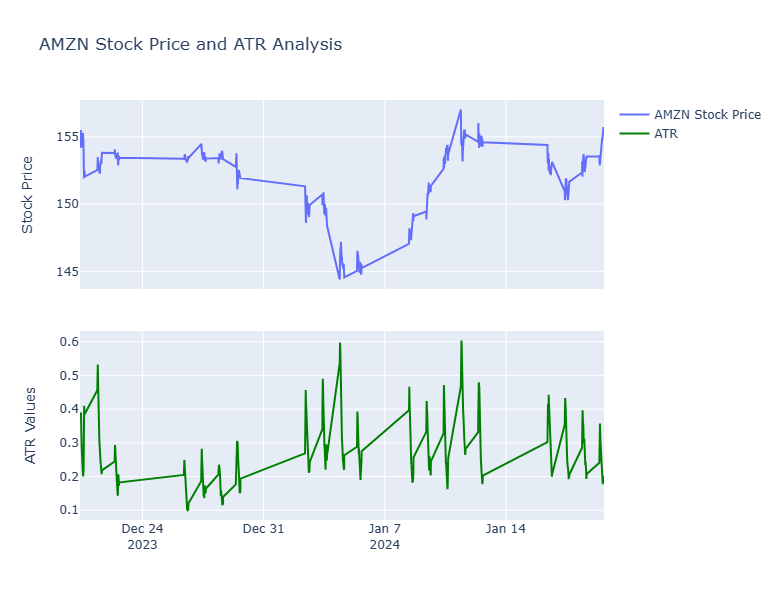

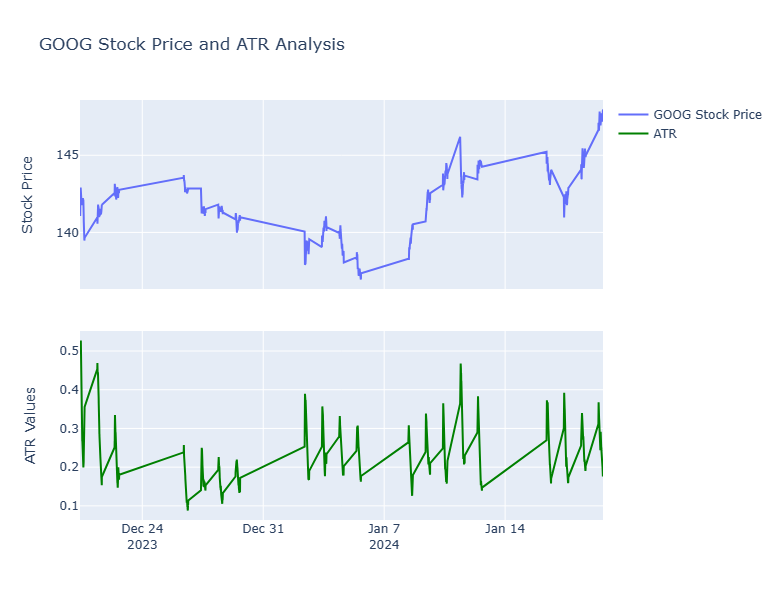

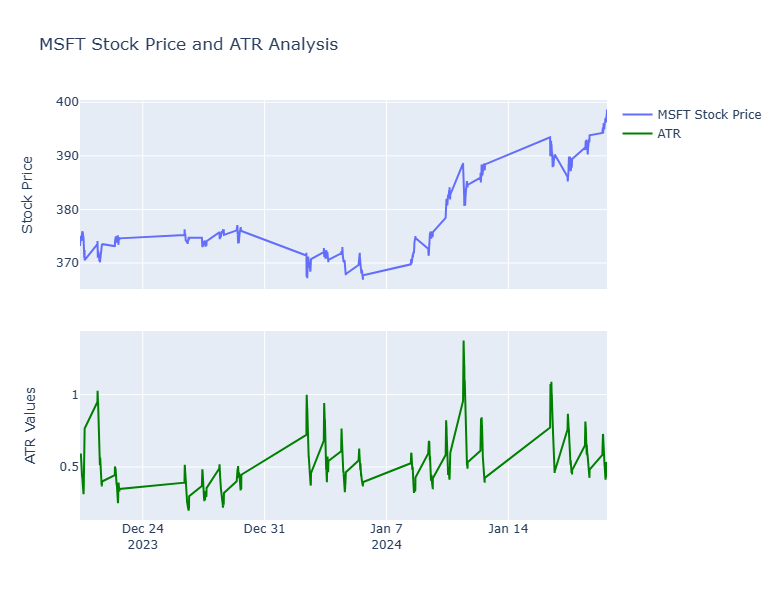

In [7]:
# Plotting the time series with ATR using Plotly
for ticker in ohlcv_data:
    df = ohlcv_data[ticker]
    
    trace1 = go.Scatter(x=df.index, y=df['Adj Close'], mode='lines', name=f'{ticker} Stock Price')
    trace2 = go.Scatter(x=df.index, y=df['ATR'], mode='lines', name='ATR', line=dict(color='green'))
    fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.1)
    
    fig.add_trace(trace1, row=1, col=1)
    fig.add_trace(trace2, row=2, col=1)
    
    fig.update_layout(title=f'{ticker} Stock Price and ATR Analysis', showlegend=True, height=600)
    fig.update_yaxes(title_text='Stock Price', row=1, col=1)
    fig.update_yaxes(title_text='ATR Values', row=2, col=1)
    fig.show()

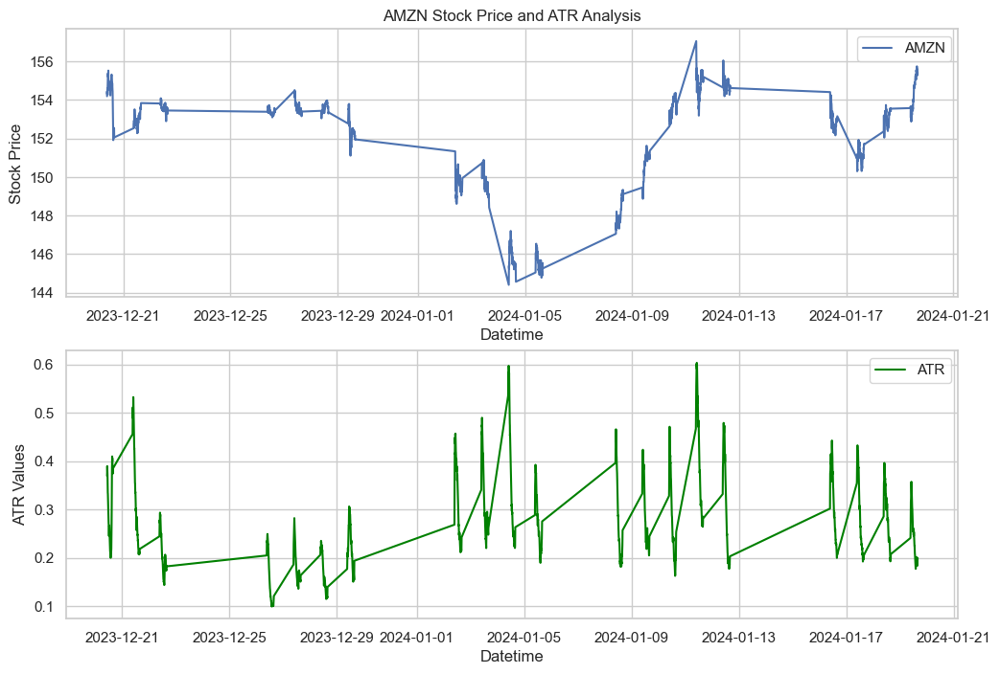

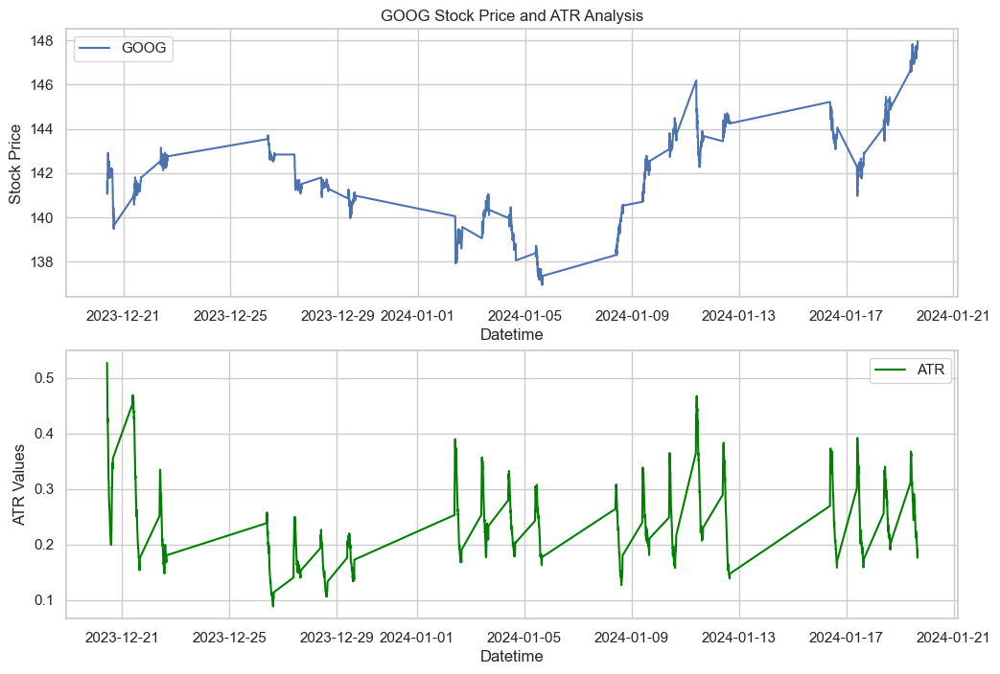

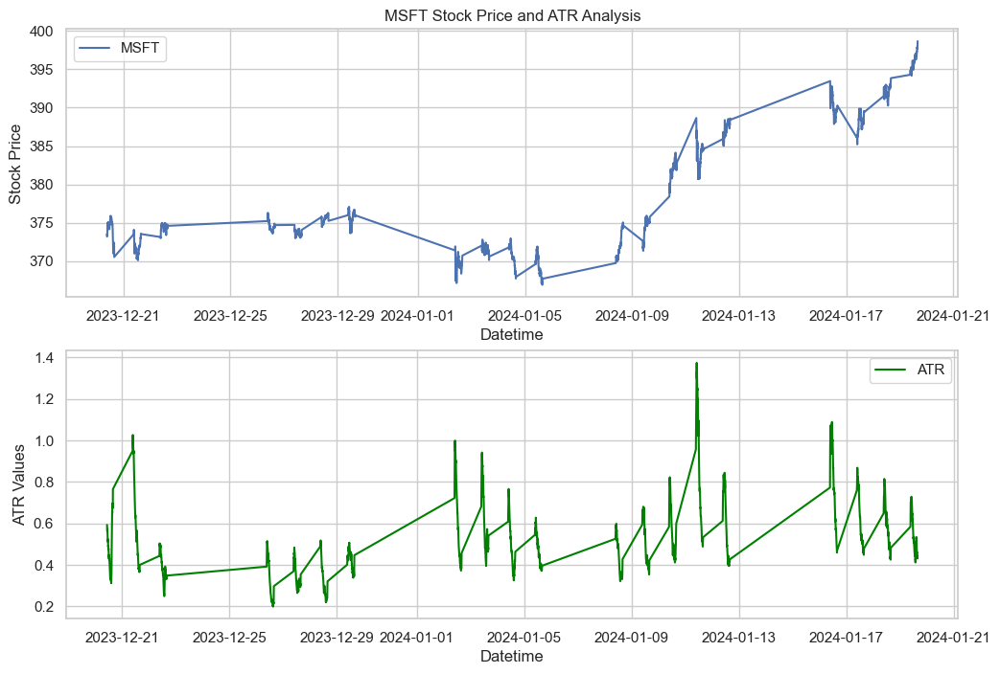

In [8]:
# Plotting the time series with ATR
for ticker in ohlcv_data:
    df = ohlcv_data[ticker]
    sns.set(style="whitegrid")
    
    plt.figure(figsize=(12, 8))
    plt.subplot(2, 1, 1)
    sns.lineplot(x=df.index, y=df['Adj Close'], label=ticker)
    plt.title(f'{ticker} Stock Price and ATR Analysis')
    plt.ylabel('Stock Price')
    
    plt.subplot(2, 1, 2)
    sns.lineplot(x=df.index, y=df['ATR'], label='ATR', color='green')
    plt.legend()
    plt.ylabel('ATR Values')
    plt.show()

In [9]:
def Boll_Band(DF, n=14):
    "function to calculate Bollinger Band"
    df = DF.copy()
    df["MB"] = df["Adj Close"].rolling(n).mean()
    df["UB"] = df["MB"] + 2*df["Adj Close"].rolling(n).std(ddof=0)
    df["LB"] = df["MB"] - 2*df["Adj Close"].rolling(n).std(ddof=0)
    df["BB_Width"] = df["UB"] - df["LB"]
    return df[["MB","UB","LB","BB_Width"]]

for ticker in ohlcv_data:
    ohlcv_data[ticker][["MB","UB","LB","BB_Width"]] = Boll_Band(ohlcv_data[ticker])

In [10]:
ohlcv_data["AMZN"].head()

,Open,High,Low,Close,Adj Close,Volume,ATR,MB,UB,LB,BB_Width
Datetime,,,,,,,,,,,
2023-12-20 09:30:00-05:00,152.899994,154.250000,152.820007,154.184998,154.184998,2687422,NaN,NaN,NaN,NaN,NaN
2023-12-20 09:35:00-05:00,154.190002,154.970001,154.190002,154.440002,154.440002,1629845,NaN,NaN,NaN,NaN,NaN
2023-12-20 09:40:00-05:00,154.440002,154.629898,154.256195,154.289993,154.289993,776885,NaN,NaN,NaN,NaN,NaN
2023-12-20 09:45:00-05:00,154.289993,154.639999,154.259995,154.529999,154.529999,611825,NaN,NaN,NaN,NaN,NaN
2023-12-20 09:50:00-05:00,154.529999,154.740005,154.330093,154.585999,154.585999,638741,NaN,NaN,NaN,NaN,NaN


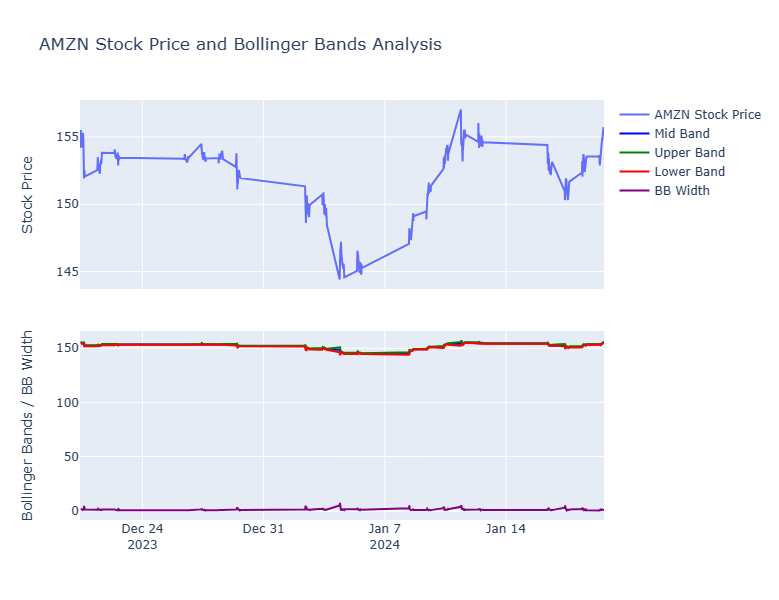

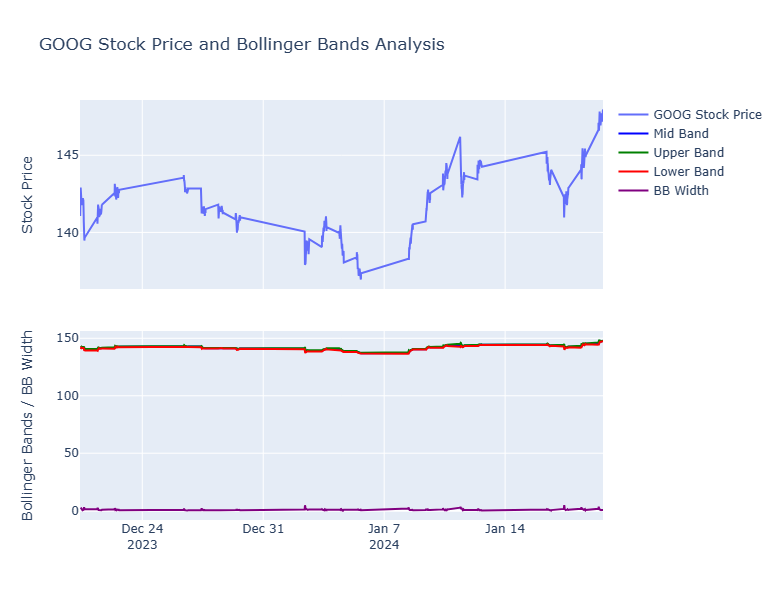

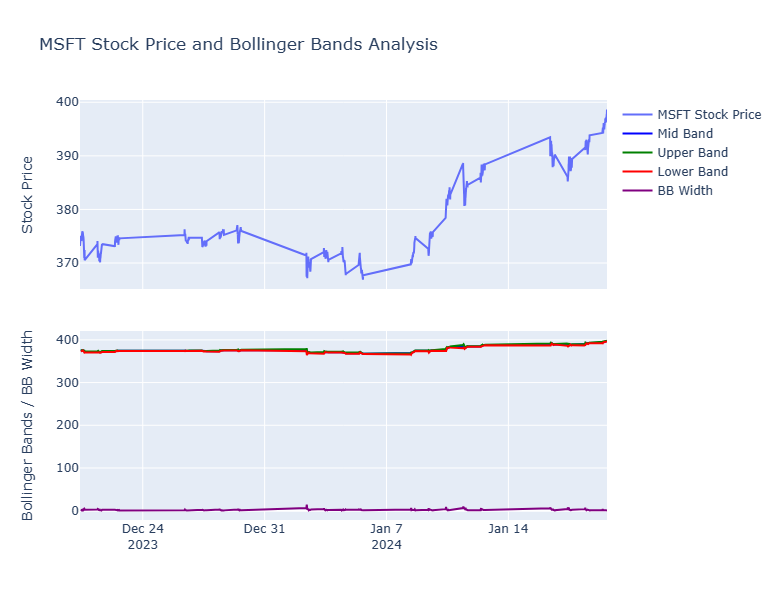

In [11]:
# Plotting the time series with Bollinger Bands and Bollinger Band Width using Plotly
for ticker in ohlcv_data:
    df = ohlcv_data[ticker]
    trace1 = go.Scatter(x=df.index, y=df['Adj Close'], mode='lines', name=f'{ticker} Stock Price')
    trace2 = go.Scatter(x=df.index, y=df['MB'], mode='lines', name='Mid Band', line=dict(color='blue'))
    trace3 = go.Scatter(x=df.index, y=df['UB'], mode='lines', name='Upper Band', line=dict(color='green'))
    trace4 = go.Scatter(x=df.index, y=df['LB'], mode='lines', name='Lower Band', line=dict(color='red'))
    trace5 = go.Scatter(x=df.index, y=df['BB_Width'], mode='lines', name='BB Width', line=dict(color='purple'))
    
    fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.1)
    fig.add_trace(trace1, row=1, col=1)
    fig.add_trace(trace2, row=2, col=1)
    fig.add_trace(trace3, row=2, col=1)
    fig.add_trace(trace4, row=2, col=1)
    fig.add_trace(trace5, row=2, col=1)
    fig.update_layout(title=f'{ticker} Stock Price and Bollinger Bands Analysis', showlegend=True, height=600)
    fig.update_yaxes(title_text='Stock Price', row=1, col=1)
    fig.update_yaxes(title_text='Bollinger Bands / BB Width', row=2, col=1)
    fig.show()

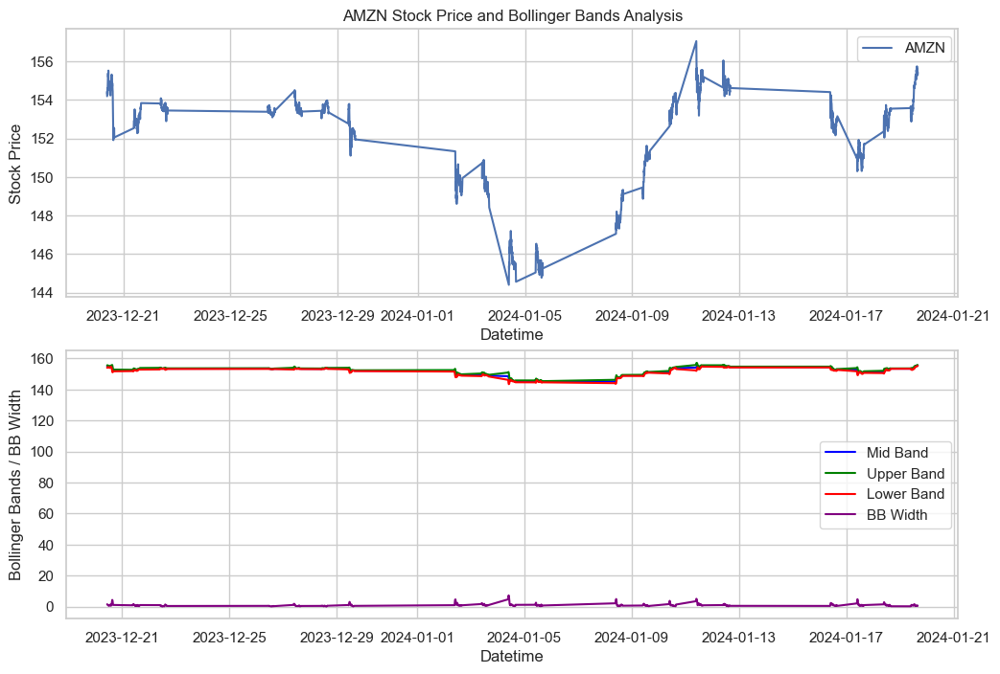

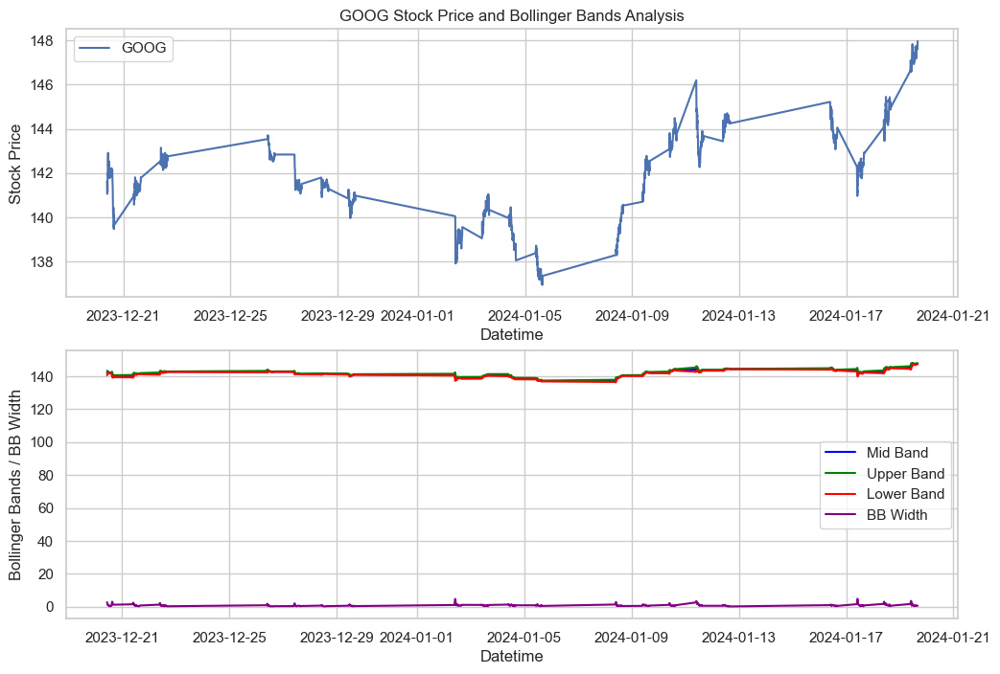

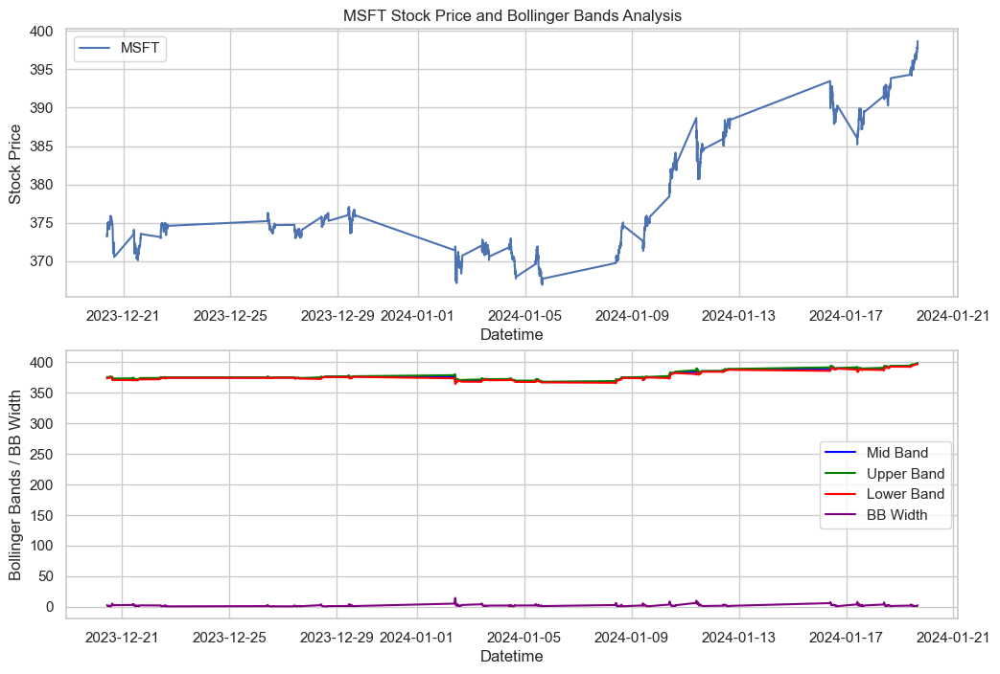

In [12]:
# Plotting the time series with Bollinger Bands and Bollinger Band Width
for ticker in ohlcv_data:
    df = ohlcv_data[ticker]
    sns.set(style="whitegrid")
    plt.figure(figsize=(12, 8))
    plt.subplot(2, 1, 1)
    sns.lineplot(x=df.index, y=df['Adj Close'], label=ticker)
    plt.title(f'{ticker} Stock Price and Bollinger Bands Analysis')
    plt.ylabel('Stock Price')
    
    plt.subplot(2, 1, 2)
    sns.lineplot(x=df.index, y=df['MB'], label='Mid Band', color='blue')
    sns.lineplot(x=df.index, y=df['UB'], label='Upper Band', color='green')
    sns.lineplot(x=df.index, y=df['LB'], label='Lower Band', color='red')
    sns.lineplot(x=df.index, y=df['BB_Width'], label='BB Width', color='purple')
    plt.legend()
    plt.ylabel('Bollinger Bands / BB Width')
    plt.show()

#### RSI - Relative Strength Index

- RSI is a momentum osillator which measures the speed and change of price movements.
- RSI value oscillates between 0 and 100 with values above 70 indicating that the asset has now reached overbought territory. Values below 30 signify oversold territory.
-  Assets can remain in overbought and oversold territories for long duration.
- Calculation follows a two step method wherein the second step acts as a smoothening technique (similar to calculating exponential MA)

RSI (step one) = 100 - [100/(1+(Avg Gain/Avg Loss))]

Link: https://www.tradingview.com/scripts/relativestrengthindex/

In [13]:
import numpy as np
def RSI(DF, n=14):
    "function to calculate RSI"
    df = DF.copy()
    df["change"] = df["Adj Close"] - df["Adj Close"].shift(1)
    df["gain"] = np.where(df["change"]>=0, df["change"], 0)
    df["loss"] = np.where(df["change"]<0, -1*df["change"], 0)
    ## Link: https://www.tradingview.com/scripts/relativestrengthindex/
    ## RMA is implemented as alpha=1/n in exponential weighted mean
    ## It can be implemented by creating a function
    df["avgGain"] = df["gain"].ewm(alpha=1/n, min_periods=n).mean()
    df["avgLoss"] = df["loss"].ewm(alpha=1/n, min_periods=n).mean()
    df["rs"] = df["avgGain"]/df["avgLoss"]
    df["rsi"] = 100 - (100/ (1 + df["rs"]))
    return df["rsi"]

for ticker in ohlcv_data:
    ohlcv_data[ticker]["RSI"] = RSI(ohlcv_data[ticker])

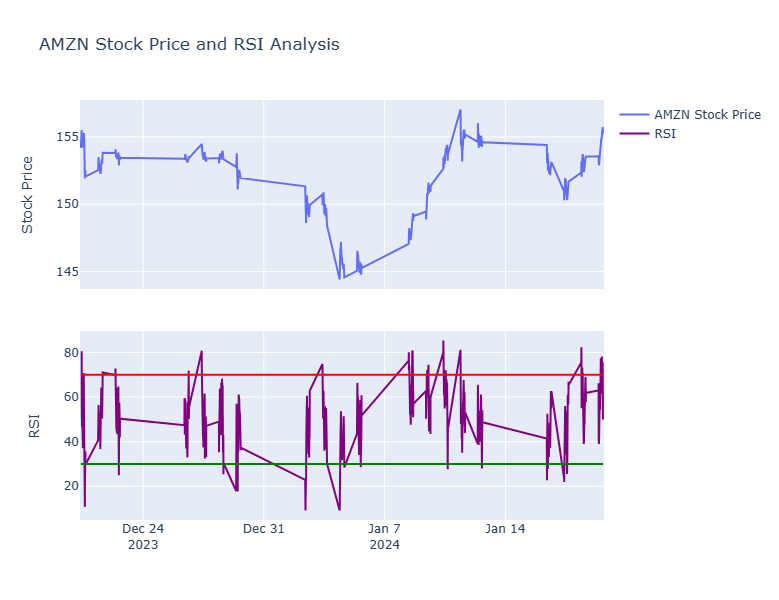

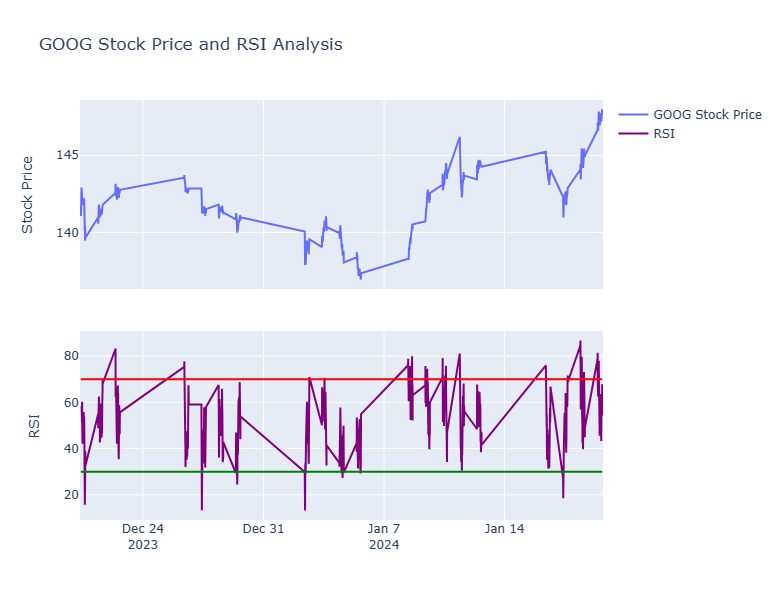

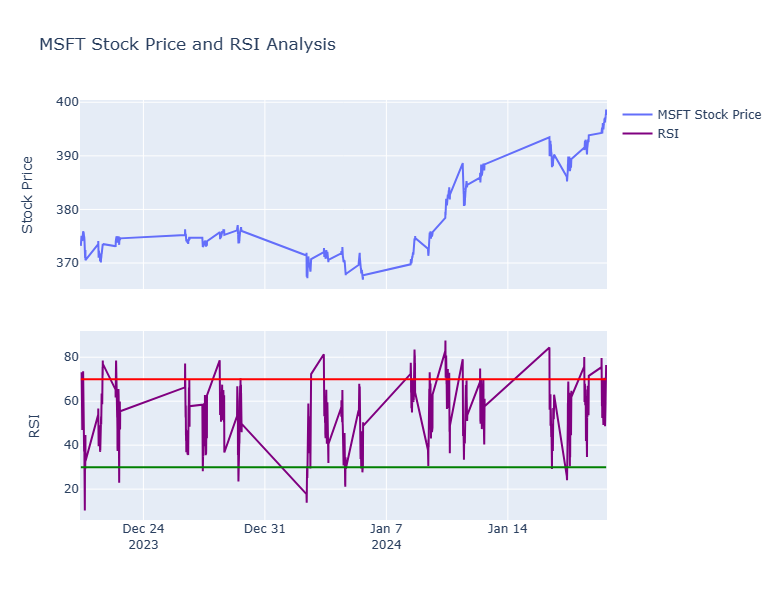

In [14]:
# Plotting the time series with RSI using Plotly
for ticker in ohlcv_data:
    df = ohlcv_data[ticker]
    
    trace1 = go.Scatter(x=df.index, y=df['Adj Close'], mode='lines', name=f'{ticker} Stock Price')
    trace2 = go.Scatter(x=df.index, y=df['RSI'], mode='lines', name='RSI', line=dict(color='purple'))
    fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.1)
    fig.add_trace(trace1, row=1, col=1)
    fig.add_trace(trace2, row=2, col=1)
    fig.update_layout(title=f'{ticker} Stock Price and RSI Analysis', showlegend=True, height=600)
    fig.update_yaxes(title_text='Stock Price', row=1, col=1)
    fig.update_yaxes(title_text='RSI', row=2, col=1)
    
    # Add horizontal lines for overbought and oversold levels (e.g., 70 and 30)
    fig.add_shape(
        type='line',
        x0=df.index[0],
        x1=df.index[-1],
        y0=70,
        y1=70,
        line=dict(color='red', width=2),
        row=2, col=1
    )
    fig.add_shape(
        type='line',
        x0=df.index[0],
        x1=df.index[-1],
        y0=30,
        y1=30,
        line=dict(color='green', width=2),
        row=2, col=1
    )
    fig.show()

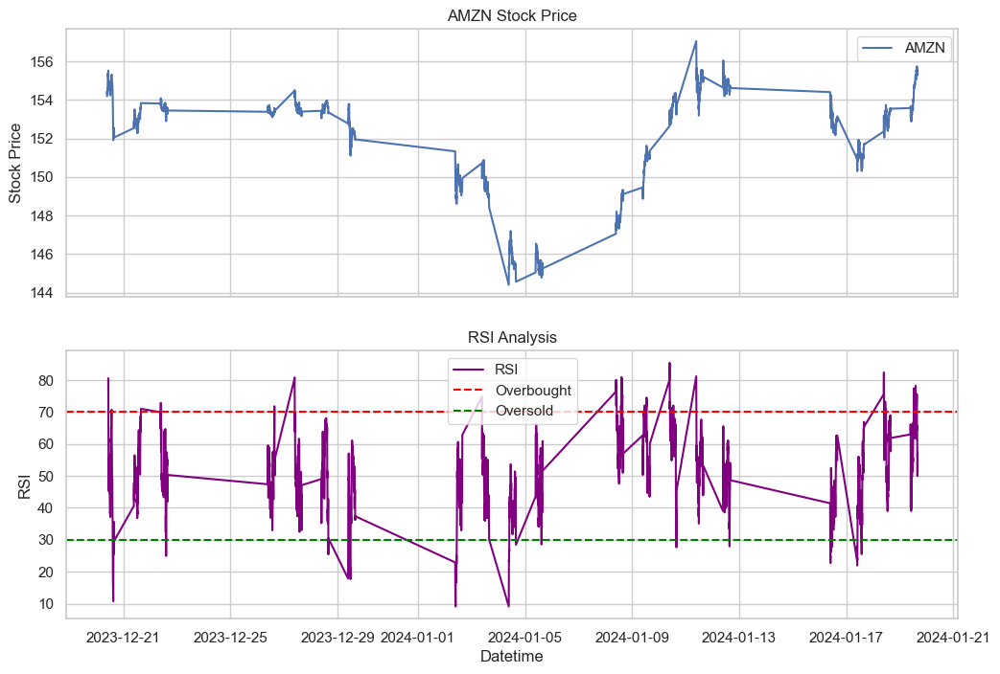

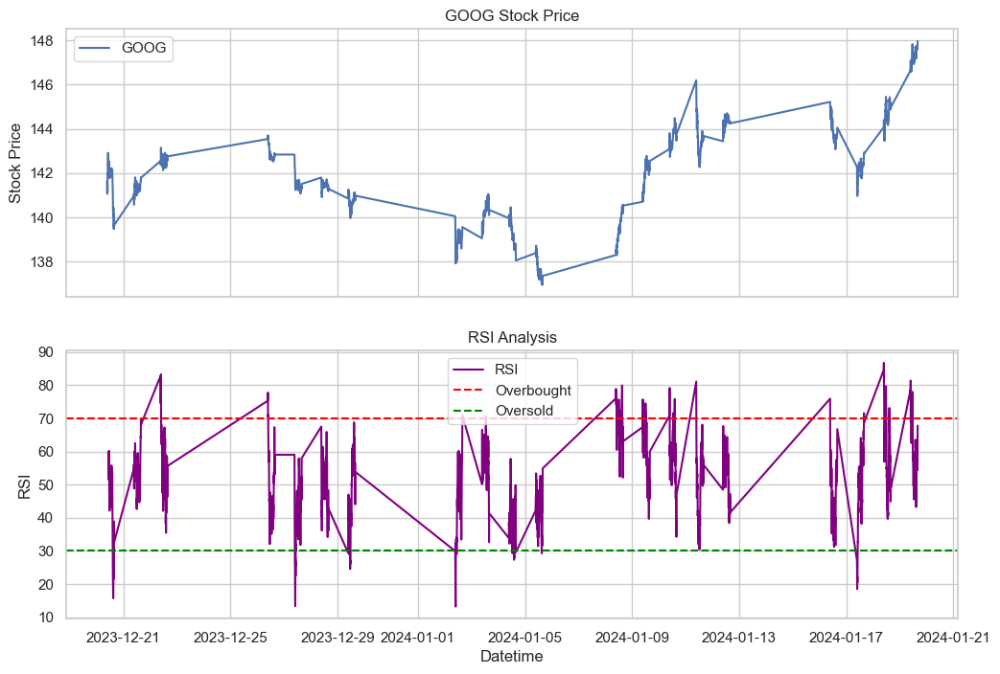

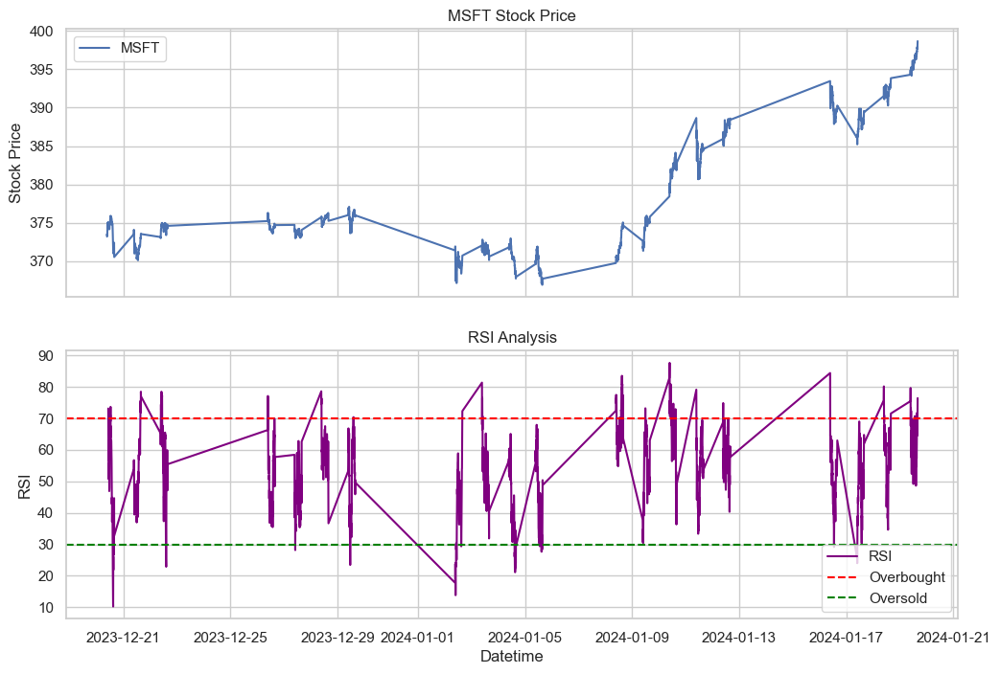

In [15]:
# Plotting the time series with RSI using Seaborn
for ticker in ohlcv_data:
    df = ohlcv_data[ticker]
    sns.set(style="whitegrid")
    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 8), sharex=True)
    sns.lineplot(x=df.index, y=df['Adj Close'], label=ticker, ax=axes[0])
    axes[0].set_title(f'{ticker} Stock Price')
    axes[0].set_ylabel('Stock Price')

    sns.lineplot(x=df.index, y=df['RSI'], label='RSI', color='purple', ax=axes[1])
    axes[1].axhline(y=70, color='red', linestyle='--', label='Overbought')
    axes[1].axhline(y=30, color='green', linestyle='--', label='Oversold')
    axes[1].set_title('RSI Analysis')
    axes[1].set_ylabel('RSI')
    axes[0].legend()
    axes[1].legend()
    plt.show()

In [16]:
ohlcv_data["AMZN"].head()

,Open,High,Low,Close,Adj Close,Volume,ATR,MB,UB,LB,BB_Width,RSI
Datetime,,,,,,,,,,,,
2023-12-20 09:30:00-05:00,152.899994,154.250000,152.820007,154.184998,154.184998,2687422,NaN,NaN,NaN,NaN,NaN,NaN
2023-12-20 09:35:00-05:00,154.190002,154.970001,154.190002,154.440002,154.440002,1629845,NaN,NaN,NaN,NaN,NaN,NaN
2023-12-20 09:40:00-05:00,154.440002,154.629898,154.256195,154.289993,154.289993,776885,NaN,NaN,NaN,NaN,NaN,NaN
2023-12-20 09:45:00-05:00,154.289993,154.639999,154.259995,154.529999,154.529999,611825,NaN,NaN,NaN,NaN,NaN,NaN
2023-12-20 09:50:00-05:00,154.529999,154.740005,154.330093,154.585999,154.585999,638741,NaN,NaN,NaN,NaN,NaN,NaN


#### ADX (Average Directional Index)

- ADX is a way of measuring the strength of a trend.
- Values range from 0 to 100 and quantifies the strength of a trend as per below:
    - 0-25: Absent or weak trend
    - 25-50: Strong trend
    - 50-75: Very strong trend
    - 75-100: Extremely strong trend
- ADX is non-directional  meaning the ADX value makes no inference about the direction of the trend but only aout strength of the trend
- The calculation  involves finding both positive and negative directional movement (by comparing successive highs and successive lows) and then calculating the smoothed average of the difference of these.

In [17]:
def ATR(DF, n=14):
    "function to calculate True Range and Average True Range"
    df = DF.copy()
    df["H-L"] = df["High"] - df["Low"]
    df["H-PC"] = abs(df["High"] - df["Adj Close"].shift(1))
    df["L-PC"] = abs(df["Low"] - df["Adj Close"].shift(1))
    df["TR"] = df[["H-L","H-PC","L-PC"]].max(axis=1, skipna=False)
    df["ATR"] = df["TR"].ewm(com=n, min_periods=n).mean()
    return df["ATR"]

def ADX(DF, n=20):
    "function to calculate ADX"
    df = DF.copy()
    df["ATR"] = ATR(DF, n)
    df["upmove"] = df["High"] - df["High"].shift(1)
    df["downmove"] = df["Low"].shift(1) - df["Low"]
    df["+dm"] = np.where((df["upmove"]>df["downmove"]) & (df["upmove"] >0), df["upmove"], 0)
    df["-dm"] = np.where((df["downmove"]>df["upmove"]) & (df["downmove"] >0), df["downmove"], 0)
    df["+di"] = 100 * (df["+dm"]/df["ATR"]).ewm(alpha=1/n, min_periods=n).mean()
    df["-di"] = 100 * (df["-dm"]/df["ATR"]).ewm(alpha=1/n, min_periods=n).mean()
    df["ADX"] = 100* abs((df["+di"] - df["-di"])/(df["+di"] + df["-di"])).ewm(alpha=1/n, min_periods=n).mean()
    return df["ADX"]

for ticker in ohlcv_data:
    ohlcv_data[ticker]["ADX"] = ADX(ohlcv_data[ticker],20)

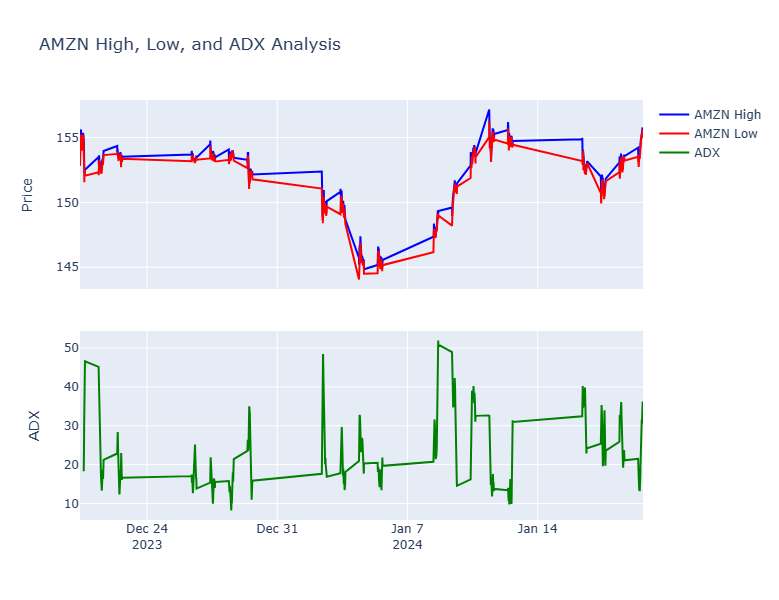

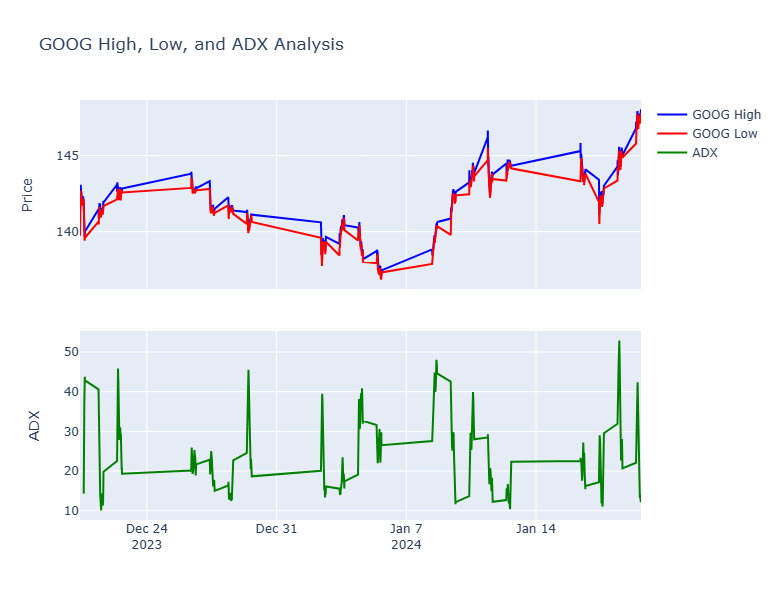

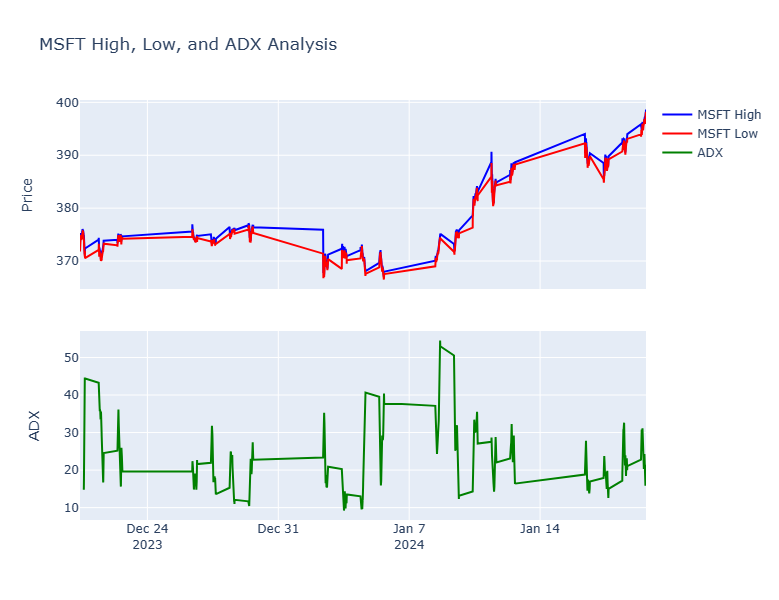

In [18]:
# Plotting the time series with ADX using Plotly
for ticker in ohlcv_data:
    df = ohlcv_data[ticker]
    
    trace1 = go.Scatter(x=df.index, y=df['High'], mode='lines', name=f'{ticker} High', line=dict(color='blue'))
    trace2 = go.Scatter(x=df.index, y=df['Low'], mode='lines', name=f'{ticker} Low', line=dict(color='red'))
    trace3 = go.Scatter(x=df.index, y=df['ADX'], mode='lines', name='ADX', line=dict(color='green'))
    fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.1)
    
    fig.add_trace(trace1, row=1, col=1)
    fig.add_trace(trace2, row=1, col=1)
    fig.add_trace(trace3, row=2, col=1)
    
    fig.update_layout(title=f'{ticker} High, Low, and ADX Analysis', showlegend=True, height=600)
    fig.update_yaxes(title_text='Price', row=1, col=1)
    fig.update_yaxes(title_text='ADX', row=2, col=1)
    fig.show()

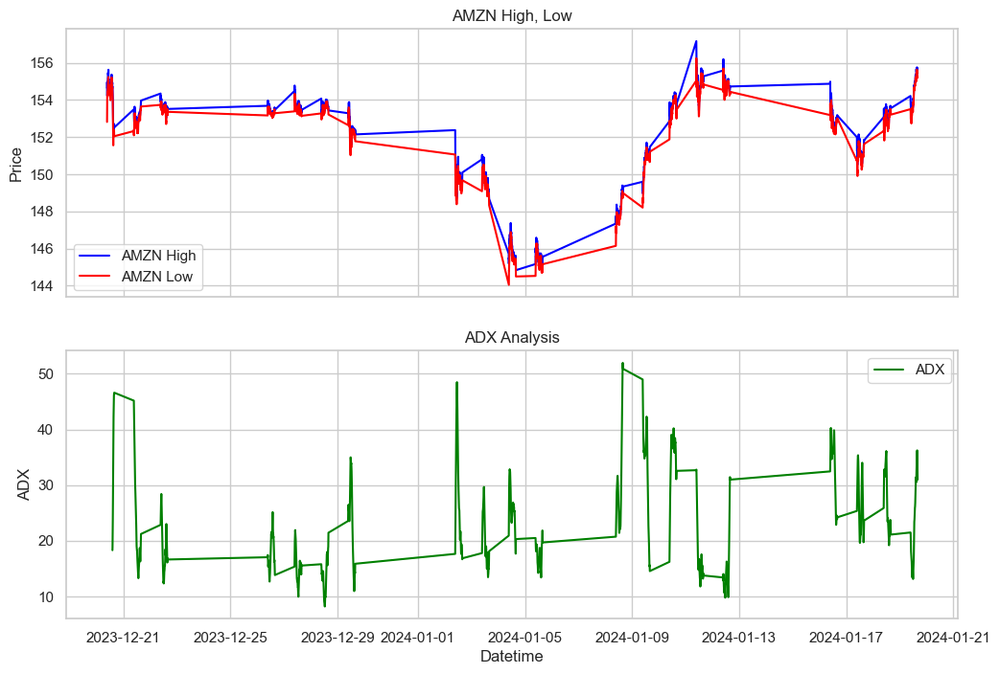

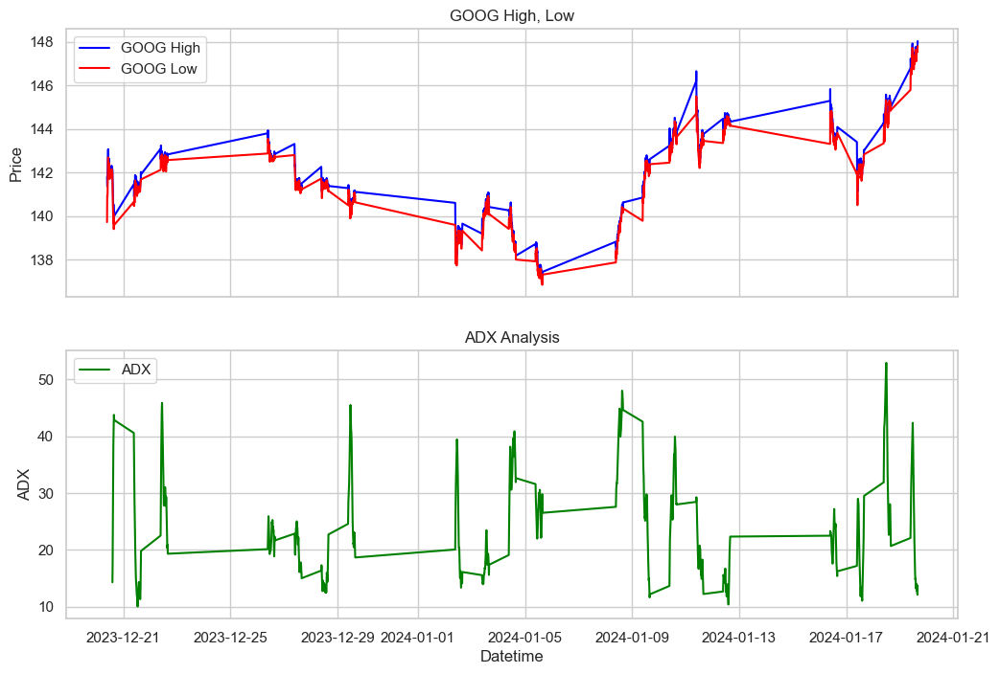

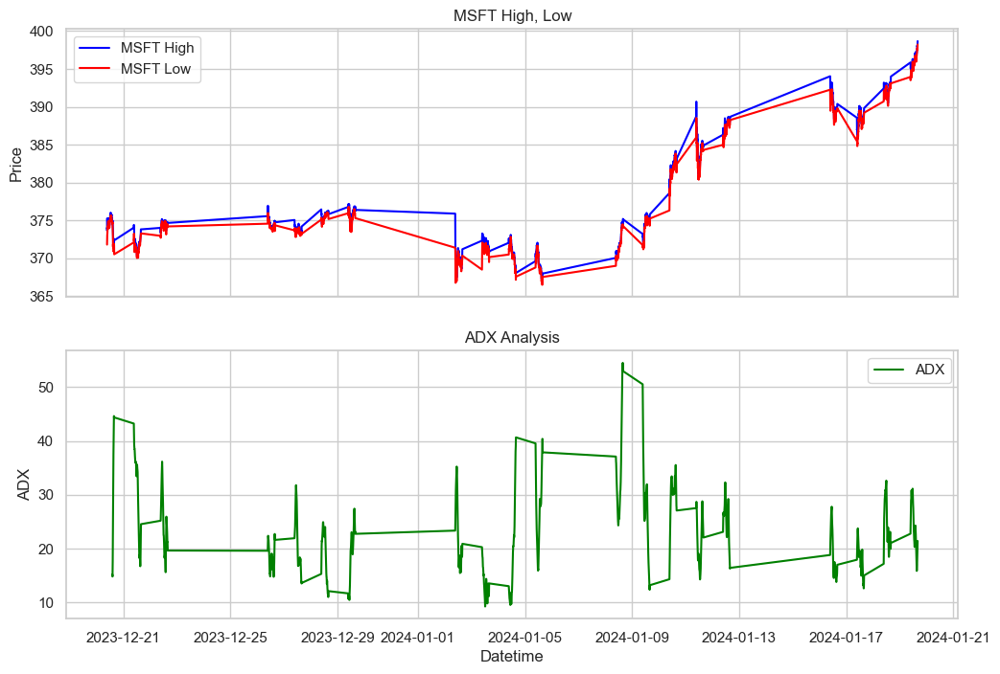

In [19]:
# Plotting the time series with ADX using Seaborn
for ticker in ohlcv_data:
    df = ohlcv_data[ticker]
    sns.set(style="whitegrid")
    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 8), sharex=True)
    
    sns.lineplot(x=df.index, y=df['High'], label=f'{ticker} High', ax=axes[0], color='blue')
    sns.lineplot(x=df.index, y=df['Low'], label=f'{ticker} Low', ax=axes[0], color='red')
    axes[0].set_title(f'{ticker} High, Low')
    axes[0].set_ylabel('Price')
    
    sns.lineplot(x=df.index, y=df['ADX'], label='ADX', color='green', ax=axes[1])
    axes[1].set_title('ADX Analysis')
    axes[1].set_ylabel('ADX')
    axes[0].legend()
    axes[1].legend()
    plt.show()

#### Renko Chart

- Renko chart is built using price movement and not price against standarized time intervals- This filters out the noise and lets you visualize the true trend.
- Price movements (fixed) are represented as bricks stacked at 45 degrees to each other. A new brick is added to the chart only when the price moves by a pre determined amount in either direction.
- Renko charts have a time axis, but the time scale is not fixed. Some bricks may take longer to form than others, depending on how long it takes the price to move the required box size.
- Renko charts typically use only the closing price based on the chart time frame choosen.
- Brick will create in same direction when price move in same direction by defined brick size. Brick will create in opposite direction when price will move in opposite direction by 2 times of defined brick size.
Github: https://github.com/ChillarAnand/stocktrends

In [20]:
# pip install stocktrends

In [21]:
# Import necesary libraries
from stocktrends import Renko

# Download historical data for required stocks
tickers = ["AMZN","GOOG","MSFT"]
ohlcv_data = {}
hour_data = {}
renko_data = {}

# looping over tickers and storing OHLCV dataframe in dictionary
for ticker in tickers:
    temp = yf.download(ticker,period='1mo',interval='5m')
    temp.dropna(how="any",inplace=True)
    ohlcv_data[ticker] = temp
    temp = yf.download(ticker,period='1y',interval='1h')
    temp.dropna(how="any",inplace=True)
    hour_data[ticker] = temp
    
def ATR(DF, n=14):
    "function to calculate True Range and Average True Range"
    df = DF.copy()
    df["H-L"] = df["High"] - df["Low"]
    df["H-PC"] = abs(df["High"] - df["Adj Close"].shift(1))
    df["L-PC"] = abs(df["Low"] - df["Adj Close"].shift(1))
    df["TR"] = df[["H-L","H-PC","L-PC"]].max(axis=1, skipna=False)
    df["ATR"] = df["TR"].ewm(com=n, min_periods=n).mean()
    return df["ATR"]

def renko_DF(DF, hourly_df):
    "function to convert ohlc data into renko bricks"
    df = DF.copy()
    df.reset_index(inplace=True)
    df.drop("Close",axis=1,inplace=True)
    df.columns = ["date","open","high","low","close","volume"]
    df2 = Renko(df)
    df2.brick_size = 3*round(ATR(hourly_df,120).iloc[-1],0)
    renko_df = df2.get_ohlc_data() #if using older version of the library please use get_bricks() instead
    return renko_df

for ticker in ohlcv_data:
    renko_data[ticker] = renko_DF(ohlcv_data[ticker],hour_data[ticker])

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [22]:
renko_data["AMZN"].head()

,date,open,high,low,close,uptrend
0,2023-12-20 09:30:00-05:00,150.0,153.0,150.0,153.0,True
1,2024-01-04 09:30:00-05:00,150.0,150.0,147.0,147.0,False
2,2024-01-10 09:40:00-05:00,150.0,153.0,150.0,153.0,True
3,2024-01-11 09:30:00-05:00,153.0,156.0,153.0,156.0,True


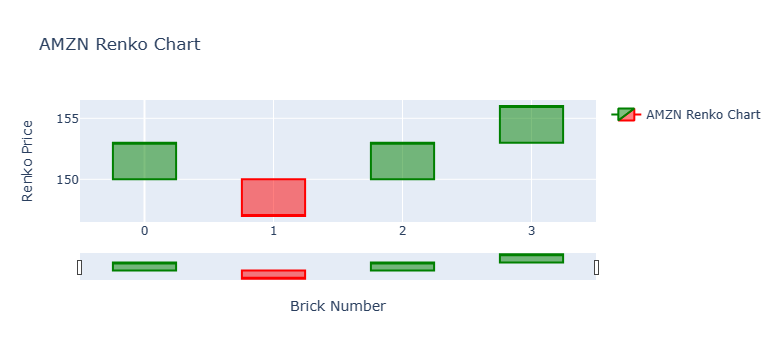

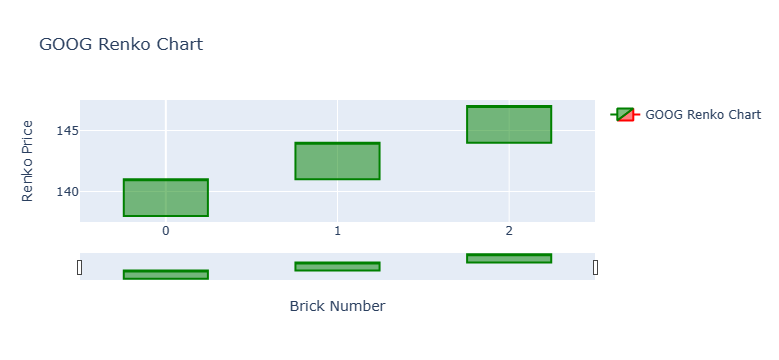

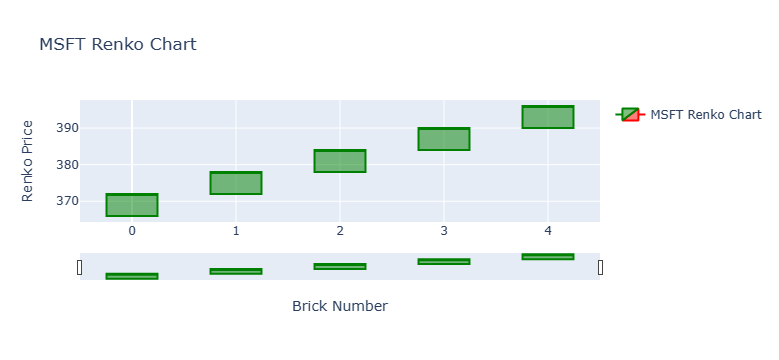

In [23]:
# Plotting Renko charts using Plotly with brick number as x-axis
for ticker in renko_data:
    renko_df = renko_data[ticker]
    trace = go.Candlestick(x=renko_df.index,
                           open=renko_df['open'],
                           high=renko_df['high'],
                           low=renko_df['low'],
                           close=renko_df['close'],
                           name=f'{ticker} Renko Chart',
                           increasing_line_color='green',
                           decreasing_line_color='red')
    layout = go.Layout(title=f'{ticker} Renko Chart',
                       xaxis=dict(title='Brick Number'),
                       yaxis=dict(title='Renko Price'),
                       showlegend=True)
    fig = go.Figure(data=[trace], layout=layout)
    fig.show()

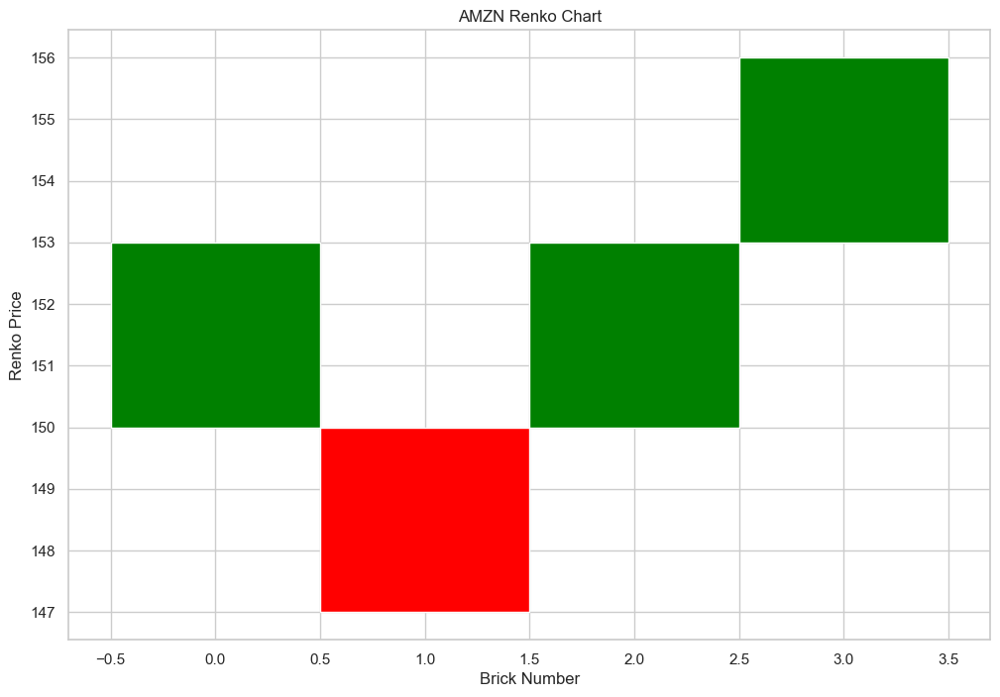

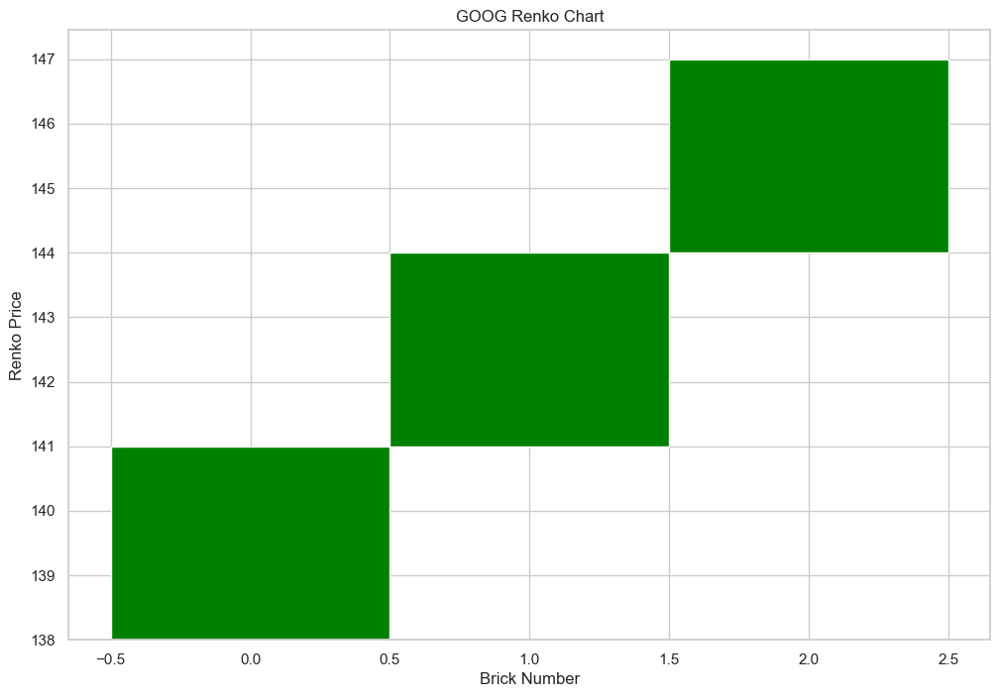

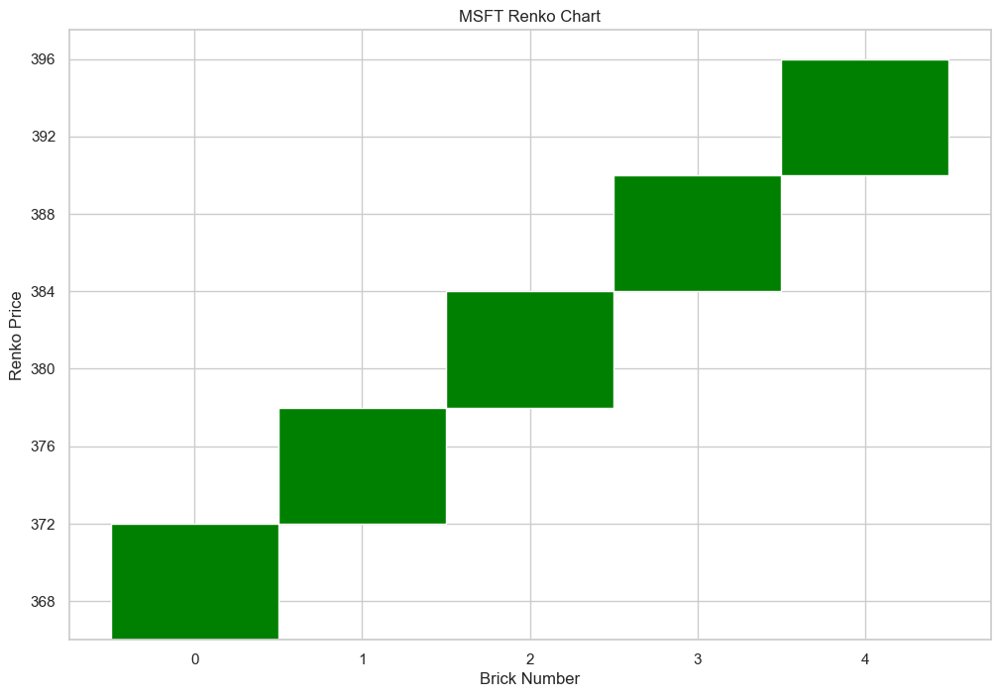

In [24]:
from matplotlib.ticker import MaxNLocator
# Function to plot Renko charts with Seaborn-like style
def plot_renko_seaborn_style(ticker, renko_df):
    sns.set(style="whitegrid")
    fig, ax = plt.subplots(figsize=(12, 8))
    colors = renko_df['close'].sub(renko_df['open']).gt(0).map({True: 'green', False: 'red'})

    ax.bar(renko_df.index, renko_df['close'] - renko_df['open'], bottom=renko_df['open'],
           width=1, color=colors)
    ax.set_xlabel('Brick Number')
    ax.set_ylabel('Renko Price')
    ax.set_title(f'{ticker} Renko Chart')
    ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

# Plotting Renko charts 
for ticker in renko_data:
    plot_renko_seaborn_style(ticker, renko_data[ticker])

In [25]:
#h/9

#### ta-lib github
Github1: https://github.com/ta-lib/ta-lib-python

Github2: https://github.com/twopirllc/pandas-ta

Github3: pip install -i https://pypi.anaconda.org/masdeseiscaracteres/simple ta-lib

In [26]:
pip install -i https://pypi.anaconda.org/masdeseiscaracteres/simple ta-lib

Looking in indexes: https://pypi.anaconda.org/masdeseiscaracteres/simple
Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement ta-lib (from versions: none)
ERROR: No matching distribution found for ta-lib


Pattern Recognisation: https://thepatternsite.com/CandleEntry.html

In [27]:
from alpha_vantage.timeseries import TimeSeries
import copy
import talib

talib.get_function_groups() #get a list of talib functions by group 

tickers = ["MSFT","AAPL","META","AMZN","INTC", "CSCO","VZ","IBM","QCOM","LYFT"]

# Extract OHLCV data for the tickers
ohlc_tech = {} # directory with ohlc value for each stock            
key_path = "D:\\Trading\\Data Extraction\\key.txt"
ts = TimeSeries(key=open(key_path,'r').read(), output_format='pandas')

attempt = 0 # initializing passthrough variable
drop = [] # initializing list to store tickers whose close price was successfully extracted
while len(tickers) != 0 and attempt <=5:
    tickers = [j for j in tickers if j not in drop]
    for i in range(len(tickers)):
        try:
            ohlc_tech[tickers[i]] = ts.get_intraday(symbol=tickers[i], interval='30min', outputsize='full')[0]
            ohlc_tech[tickers[i]].columns = ["Open","High","Low","Adj Close","Volume"]
            drop.append(tickers[i])      
        except:
            print(tickers[i]," :failed to fetch data...retrying")
            continue
    attempt+=1

 
tickers = ohlc_tech.keys() # redefine tickers variable after removing any tickers with corrupted data
ohlc_dict = copy.deepcopy(ohlc_tech) #create a copy of extracted data


# Apply talib functions on each dataframe - refer documentation at https://mrjbq7.github.io/ta-lib/doc_index.html
for ticker in tickers:
    # Calculate momentum indicators (e.g. MACD, ADX, RSI etc.) using talib
    ohlc_dict[ticker]["ADX"] = talib.ADX(ohlc_dict[ticker]["High"],
                                        ohlc_dict[ticker]["Low"],
                                        ohlc_dict[ticker]["Adj Close"],
                                        timeperiod=14)
    # Identify chart patterns (e.g. two crows, three crows, three inside, engulging pattern etc.)
    ohlc_dict[ticker]["3I"] = talib.CDL3WHITESOLDIERS(ohlc_dict[ticker]["Open"],
                                                 ohlc_dict[ticker]["High"],
                                                 ohlc_dict[ticker]["Low"],
                                                 ohlc_dict[ticker]["Adj Close"])
    
    # Statistical functions (e.g. beta, correlation etc.)
    ohlc_dict[ticker]["Beta"] = talib.BETA(ohlc_dict[ticker]["High"],
                                         ohlc_dict[ticker]["Low"],
                                         timeperiod=14)


ModuleNotFoundError: No module named 'talib'